# Practice with Spatial Data and Geopandas
### Alex
This notebook is meant to be extra practice with plotting spatial data using `matplotlib` and `geopandas`. You will be required to:
- convert a `.csv` file to a `GeoDataFrame`
- use `dissolve` on a `GeoDataFrame`
- work with figures and axes to plot layers
- join two datasets together using `.merge`
- do a spatial join and plot based on the joined column
  
There are a lot of different datasets, and you may find these problems significantly harder than the practice problems or the homework. They are meant to be extra practice for `matplotlib`. Many of the skills and patterns you see here were used in projects, and you may find them useful in yours if you plan to do some more complex mapping. If you find yourself struggling and you want to learn, but you are stuck, please drop in on office hours and talk it over with a TA.


In [2]:
from vega_datasets import data # dataset library
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

In [ ]:
# Dissolve
county_map = county_map.drop(['AFFGEOID', 'GEOID', 'NAME', 'COUNTYFP'], axis=1)
state_map = county_map.dissolve(by='STATEFP').reset_index()
state_map['STATEFP'] = state_map['STATEFP'].astype(int)
state_map = state_map.merge(fips_codes, left_on='STATEFP', right_on='st')

# Problem 1) World Earthquake Plot
### Alex
Plot the `earthquakes` dataset (stored in the variable `quakes`) on a map of the world. The background countries should be color `gray` and the earhthquakes should be plotted as orange points, where each point has a `markersize` corresponding to the magnitude of the earthquake squared. Your plot should look something like this:  
  
![World Quakes](spatial_viz_img/world_quakes.png)

Here is the `earthquake` dataset. It is a `GeoDataFrame` with many columns, with information about the magnitude, location, time, etc. All you need to worry about is the `mag` and `geometry` columns, but see what else you can come up with using this data. You can use pandas `to_datetime` function to convert the `time` column to `DateTime` format (the unit is `ms`). This might be useful if you have read the extra lesson on time-series data.

In [ ]:
quakes = gpd.read_file(data.earthquakes.url)
quakes.head()

Here is a world map as a `GeoDataFrame`, just like the one we used in class.

In [ ]:
countries = gpd.read_file('data/countries.geojson')
countries.head()

In [ ]:
fig, ax = plt.subplots(1, figsize=(15, 7))
countries.plot(ax=ax, color='gray')
quakes.plot(ax=ax, markersize=quakes['mag'] ** 2, color='orange')
fig.show()

# Problem 2: Joined Chloropleth Plot
### Alex
Plot the lower 48 states of the USA, colored by the obesity rate. This will require you to join the `state_map` dataset with the `obesity` dataset and then drop Hawaii and Alaska from the result. As a note, `.merge` returns whatever type the function is originally called on.  
  
For example, if we have a `GeoDataFrame` called `gdf` and a `DataFrame` called `df`, and I call `gdf.merge(df)`, the return type will be `GeoDataFrame`. However, if I call `df.merge(gdf)`, the return type will be `DataFrame`. Keep this in mind when joining the two datasets. Your result should look something like this: 
  
![Obesity Chloropleth](spatial_viz_img/obesity_rate_chloropleth.png)

Here is the `obesity` dataset. It has a state name, an id, and a rate of obesity for that particular state. You will need to join this with the `fips_codes` dataset, which will hopefully be clear.

In [9]:
obesity = pd.read_csv('data/obesity.csv')
obesity.head()

,id,rate,state
0,1,0.187,AL
1,2,0.198,AK
2,4,0.133,AZ
3,5,0.175,AR
4,6,0.151,CA


Here is a `GeoDataFrame` with each county of the US marked. To complete this problem, you will have to use `dissolve` to collapse the file into the individual states. You will need to use the `STATEFP` column as the grouping column. After grouping, you will need to use the `reset_index` function of `pandas` to turn `STATEFP` from the index of the `DataFrame` to one of the columns, on which we can then do a join.

In [34]:
county_map = gpd.read_file('data/usa_map.geojson')
state_map = county_map.dissolve(by='STATEFP').reset_index()
state_map['STATEFP'] = state_map['STATEFP'].astype(int)
state_map.head()


,STATEFP,geometry,COUNTYFP,AFFGEOID,GEOID,NAME
0,1,"MULTIPOLYGON (((-88.34674 30.39070, -88.34505 ...",001,0500000US01001,01001,Autauga
1,2,"MULTIPOLYGON (((-179.14820 51.27013, -179.1457...",016,0500000US02016,02016,Aleutians West
2,4,"POLYGON ((-109.04761 32.42638, -109.04829 32.0...",005,0500000US04005,04005,Coconino
3,5,"POLYGON ((-90.95500 34.11897, -90.94851 34.111...",011,0500000US05011,05011,Bradley
4,6,"MULTIPOLYGON (((-119.57727 33.27858, -119.5716...",001,0500000US06001,06001,Alameda


As you may notice, to create the map, you will need to join the two datasets together. The problem is, the `obesity` dateset only has the 'short' state name (like CA for California). However, the county map must be joined on the `STATEFP` column. For this, we must use another dataset of *FIPS Codes* - standard ids, short names, etc. of the USA. The `st` column corresponds to the `STATEFP` column of the `county_map` dataset, and the `stusps` column corresponds to the `state` columns of the `obesity` dataset.

In [6]:
fips_codes = pd.read_csv('data/us-state-ansi-fips.csv')
fips_codes.head()

Index(['stname', 'st', 'stusps'], dtype='object')

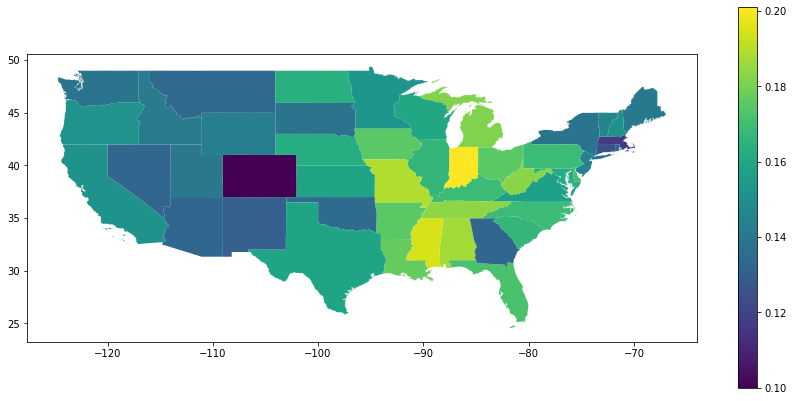

In [10]:
fips_gdf = state_map.merge(fips_codes, left_on='STATEFP', right_on='st', how='inner')
obesity_gdf = fips_gdf.merge(obesity, left_on='stusps', right_on='state', how='inner')
is_alaska = obesity_gdf['stusps'] == 'AK'
is_hawaii = obesity_gdf['stusps'] == 'HI'
is_lower_48 = (~is_alaska) & ~ (is_hawaii)
obesity_gdf_filterd = obesity_gdf[is_lower_48]
obesity_gdf_filterd.plot(column='rate', legend=True, figsize=(15, 7))
plt.show()

# Problem 3) CSV to `GeoDataFrame`
### Alex
This problem is practice for converting a .csv file to a `GeoDataFrame` using the `zip` function. Given the `airports` dataset as a `DataFrame`, create a `GeoDataFrame` and store it in an `airports_gdf` variable. Then use `.sjoin` to plot the lower 48 states and only those airports that appear in those states. Plot the background as 'lightgray', give the airports a `markersize` of 3, and be sure to drop Alaska and Hawaii. Your plot should look something like this:  
  
![Airport Plot](spatial_viz_img/airports_lower_48.png)

You should use the same map of the lower 48 states that you used in the last problem. Here is the `airports` dataset - it is a `DataFrame`, so you will need to convert it to a `GeoDataFrame` using `shapely.geometry.Point`, which was demonstrated in lecture.

In [22]:
from shapely.geometry import Point
airports = pd.read_csv('data/airports.csv')
airports['geometry'] = [Point(long, lat) for long, lat in 
                           zip(airports['longitude'], airports['latitude'])]
airports_gdf = gpd.GeoDataFrame(airports, geometry='geometry').loc[:, ['state', 'geometry']]
airports_gdf.head()

,state,geometry
0,MS,POINT (-89.23450 31.95376)
1,TX,POINT (-95.01793 30.68586)
2,CO,POINT (-104.56989 38.94575)
3,NY,POINT (-78.05208 42.74135)
4,FL,POINT (-81.90594 30.68801)


In [25]:
fips_gdf_necessary = fips_gdf.loc[:, ['stusps', 'geometry']]
is_hawaii = fips_gdf_necessary['stusps'] == 'HI'
lower_48_map = fips_gdf_necessary[(~is_alaska) & (~is_hawaii)]
lower_48_map.head()

,stusps,geometry
0,AL,"MULTIPOLYGON (((-88.34674 30.39070, -88.34505 ..."
2,AZ,"POLYGON ((-109.04761 32.42638, -109.04829 32.0..."
3,AR,"POLYGON ((-90.95500 34.11897, -90.94851 34.111..."
4,CA,"MULTIPOLYGON (((-119.57727 33.27858, -119.5716..."
5,CO,"POLYGON ((-102.04158 37.64428, -102.04162 37.6..."


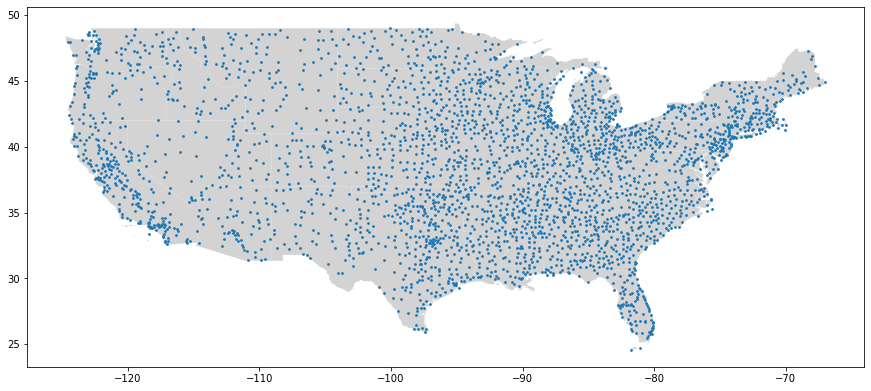

In [28]:
# sjoin took forever, so I'm going a different way
unique_lower_48 = set(lower_48_map['stusps'].unique())
is_lower_48 = airports_gdf['state'].apply(lambda d: d in unique_lower_48)
airports_gdf = airports_gdf[is_lower_48]

fig, ax = plt.subplots(1, figsize=(15, 7))
lower_48_map.plot(ax=ax, color='lightgray')
airports_gdf.plot(ax=ax, markersize=3)

# Challenge Problem) Centroid Map
### Alex
Using the `airports` dataset, plot a centroid map of the airports in the lower 48 United States. Do this by plotting points that are the average of the latitude and longitude of airports in a given state, but have size correlated to the total number of airports in that state. Your plot should look something like this:  
  
![Centroid Map](spatial_viz_img/airports_centroid.png)  
  
Notice that the location of the circles is 'weighted' towards areas that have more airports, such as towards the west side in Washington, and the size is encoded with the number of airports in the state (California has more than Washington, so California's circle is larger).

In [29]:
# Create the centroid GeoDataFrame - average of latitude and longitude,
# count of airports
airports_centroid_base = airports[['state', 'latitude', 'longitude']]
airports_count_by_state = airports_centroid_base.groupby('state').count()
airports_count_by_state = airports_count_by_state.rename(columns={'latitude': 'count'})\
    .drop(['longitude'], axis=1)\
    .reset_index()
airports_location_average = airports_centroid_base.groupby('state')\
    .mean()\
    .reset_index()
airports_centroid = airports_location_average.merge(airports_count_by_state, on='state')
airports_centroid = gpd.GeoDataFrame(airports_centroid, geometry=[Point(lon, lat)\
    for lat, lon in zip(airports_centroid['latitude'], airports_centroid['longitude'])])

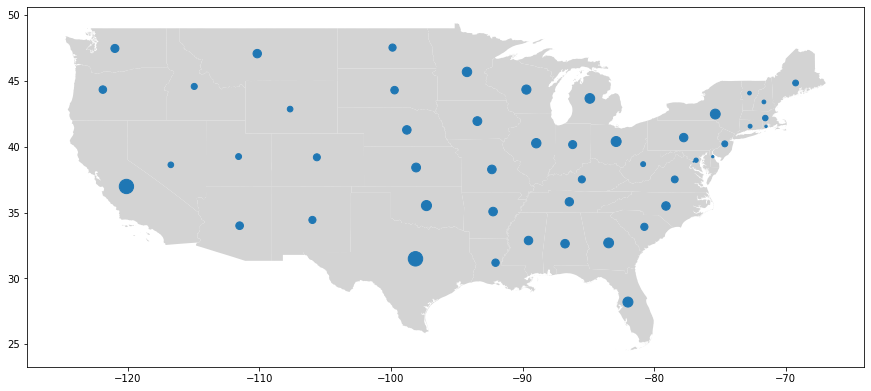

In [33]:
fig, ax = plt.subplots(1, figsize=(15, 7))
airports_centroid_lower_48 = gpd.sjoin(airports_centroid, lower_48_map, how='inner')
lower_48_map.plot(ax=ax, color='lightgray')
airports_centroid_lower_48.plot(ax=ax, markersize=airports_centroid_lower_48['count'])